## Adavanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms，gradients,etc.,to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the orginal image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
#%matplotlib qt
# prepare object points, like (0,0,0),(1,0,0),(2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret,corners = cv2.findChessboardCorners(gray,(9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img,(9,6),corners,ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
         
cv2.destroyAllWindows()

## Calibrate:calculate distortion coefficients,and test undistortion on an image

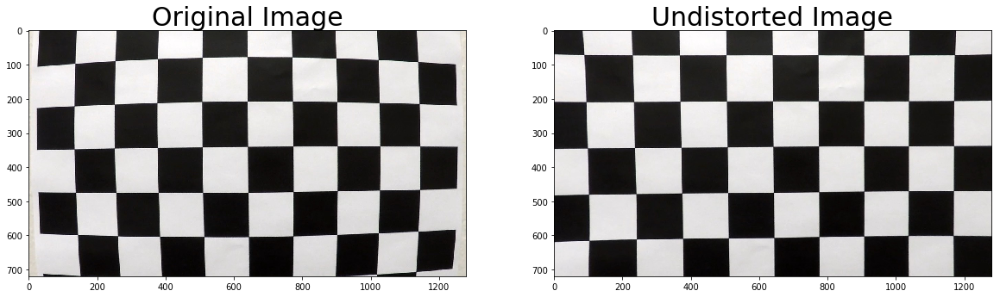

In [2]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1],img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/calibration1_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle,open("camera_cal/wide_dist_pickle.p","wb"))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst,cv2.COLOR_BGR2RGB)
# Visualize undistortion
f,(ax1,ax2) = plt.subplots(1,2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image',fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image',fontsize=30)

# Pipeline(test images)

## Distortion correction that was calculated via camera calibration applied to each test image.

cameraMatrix: 
 [[  1.15396093e+03   0.00000000e+00   6.69705359e+02]
 [  0.00000000e+00   1.14802495e+03   3.85656232e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
distCoeffs: 
 [[ -2.41017968e-01  -5.30720497e-02  -1.15810318e-03  -1.28318543e-04
    2.67124302e-02]]


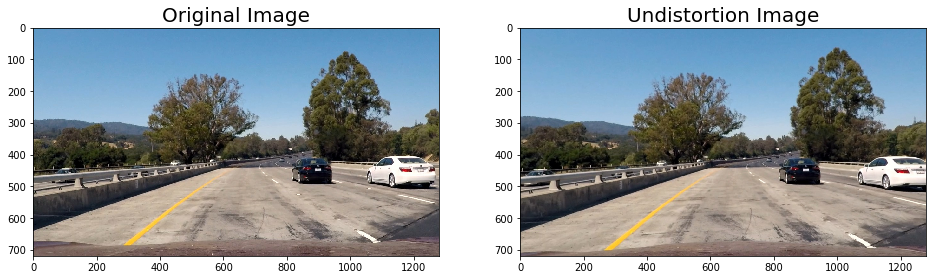

In [3]:
# Undistortion test images
# Load pickled distortion matrix
with open('camera_cal/wide_dist_pickle.p',mode='rb') as f:
    dist_pickle = pickle.load(f)
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    
print('cameraMatrix: \n',mtx)
print('distCoeffs: \n',dist)

# Read the list of test images
images_test = glob.glob('./test_images/test*.jpg')
images_origin = []
images_undist = []

for idx,fname in enumerate(images_test):
    img = mpimg.imread(fname)
    dst = cv2.undistort(img,mtx,dist,None,mtx)
    images_origin.append(img)
    images_undist.append(dst)
    
    write_name = './output_images/test_images'+'undistorted'+str(idx+1)+'.jpg'
    mpimg.imsave(write_name,dst)
    
f,(ax1,ax2) = plt.subplots(1,2,figsize=(16,8))
ax1.imshow(images_origin[0])
ax1.set_title('Original Image',fontsize=20)
ax2.imshow(images_undist[0])
ax2.set_title('Undistortion Image',fontsize=20)

## Use color transforms，gradients,etc.,to create a thresholded binary image
* Abs of the Gradient
* Magnitude of the Gradient
* Direction of the Gradient
* Combining Sobel Thresholds
* HLS Color Threshold
* Combined Threshold
___
### Abs of the Gradient

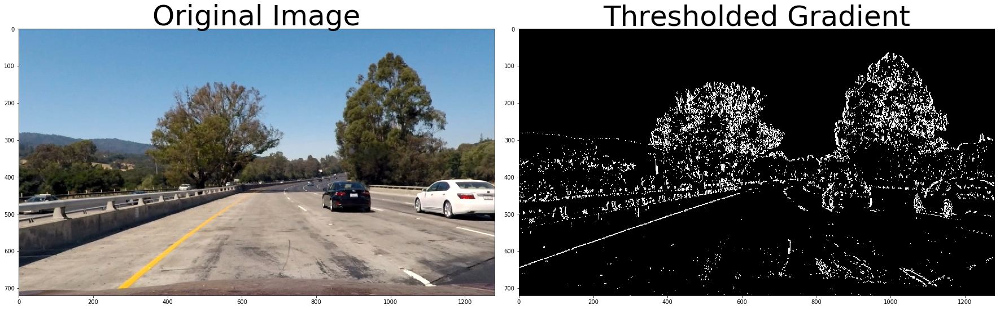

In [4]:

# Read in an image and grayscale it
image = mpimg.imread('test_images/test1_undist.jpg')

# Define a function that applies Sobel x or y,
# then takes an absolute value and applies a threshold.
ksize=3

def abs_sobel_thresh(img,orient='x',sobel_kernel=ksize,thresh=(20,100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=,<=) thresholds,but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

# Run the function
grad_binary = abs_sobel_thresh(image,orient='x',thresh=(20,100))
# Plot the result 
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title("Original Image",fontsize=50)
ax2.imshow(grad_binary,cmap='gray')
ax2.set_title('Thresholded Gradient',fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Magnitude of the Gradient

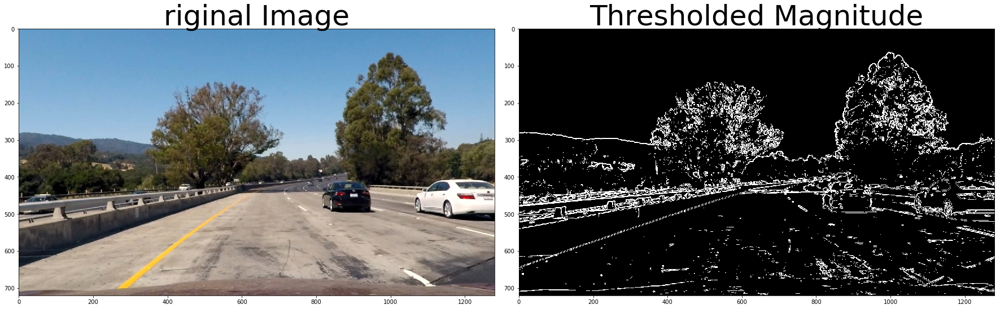

In [5]:

# Define a function that applies Sobel x and y,
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img,sobel_kernel=3, mag_thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] =1
    
    return binary_output

# Run the function
mag_binary = mag_thresh(image,sobel_kernel=3,mag_thresh=(30,100))
# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('riginal Image',fontsize=50)
ax2.imshow(mag_binary,cmap='gray')
ax2.set_title('Thresholded Magnitude',fontsize=50)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

### Direction of the Gradient

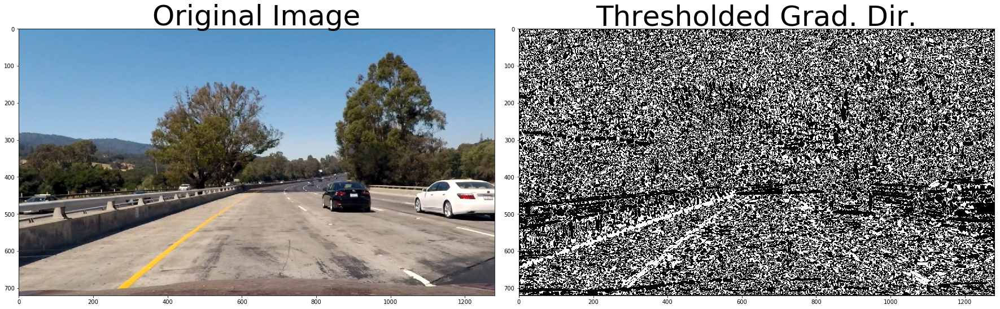

In [6]:

# Define a function that applies Sobel x and y,
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img,sobel_kernel=3,thresh=(0,np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    # Take the absolute value of the gradient direction
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    return binary_output

# Run the function
dir_binary = dir_threshold(image,sobel_kernel=15, thresh=(0.7,1.3))
# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image',fontsize=50)
ax2.imshow(dir_binary,cmap='gray')
ax2.set_title('Thresholded Grad. Dir.',fontsize=50)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

### Combining Sobel Thresholds

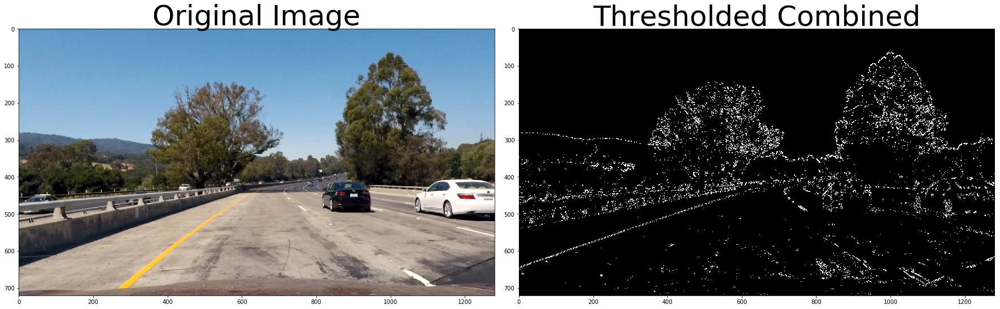

In [7]:
# Read in an image
image = mpimg.imread('test_images/test1_undist.jpg')

# Choose a Sobel kernel size
ksize =3 #Choose a larger odd number to smooth gradient measurements

def combined(img, sobel_kernel=3):
    gradx = abs_sobel_thresh(img,orient='x',sobel_kernel=ksize,thresh=(20,100))
    grady = abs_sobel_thresh(img,orient='y',sobel_kernel=ksize,thresh=(20,100))
    mag_binary = mag_thresh(img,sobel_kernel=ksize,mag_thresh=(30,100))
    dir_binary = dir_threshold(img,sobel_kernel=ksize,thresh=(0.7, 1.3))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))]= 1

    return combined

# Apply each of the thresholding functions
# gradx = abs_sobel_thresh(image,orient='x',sobel_kernel=ksize,thresh=(90,100))
# grady = abs_sobel_thresh(image,orient='y',sobel_kernel=ksize,thresh=(90,100))
# mag_binary = mag_thresh(image,sobel_kernel=ksize,mag_thresh=(100,150))
# dir_binary = dir_threshold(image,sobel_kernel=ksize,thresh=(0.7,1.3))

# combined = np.zeros_like(dir_binary)
# combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))]= 1
combined_image = combined(image, sobel_kernel=3)
# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image',fontsize=50)
ax2.imshow(combined_image,cmap='gray')
ax2.set_title('Thresholded Combined',fontsize=50)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

## HLS Color Threshold

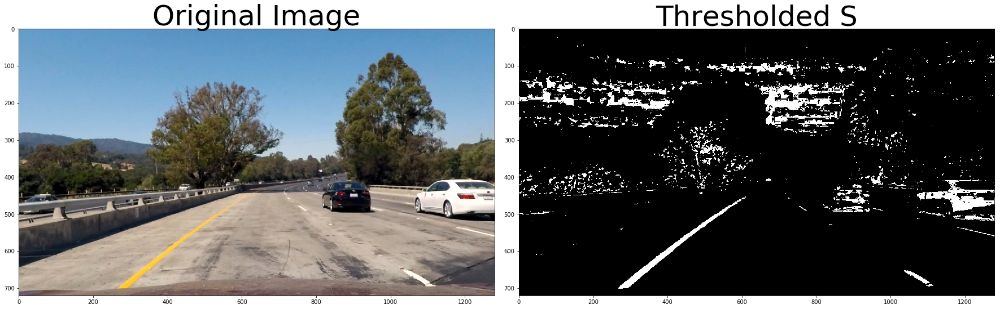

In [8]:
# Read in an image
image = mpimg.imread('test_images/test1_undist.jpg')

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img,thresh=(0,255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

hls_binary = hls_select(image,thresh=(130,255))

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image',fontsize=50)
ax2.imshow(hls_binary,cmap='gray')
ax2.set_title('Thresholded S',fontsize=50)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

### Combined Threshold

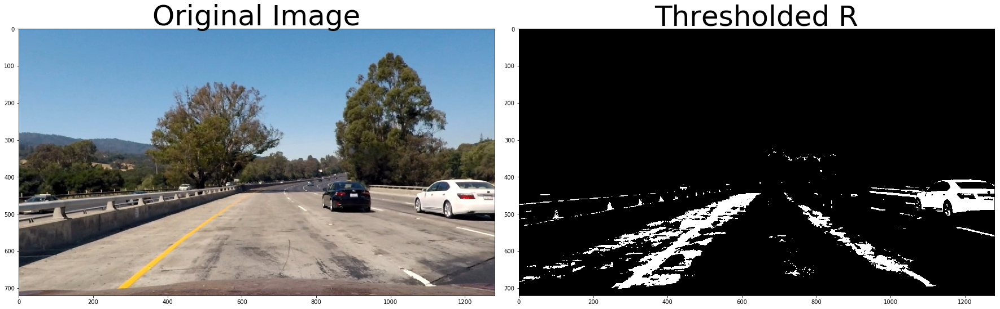

In [9]:
# Binary red channel threshold with scale
def r_thresh(img,thresh=(0,255)):
    r_channel = img[:,:,0]
    # Threshold color channel
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= thresh[0]) & (r_channel <= thresh[1])] = 1
    
    return r_binary

binary = r_thresh(image,thresh=(200,255))

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image',fontsize=50)
ax2.imshow(binary,cmap='gray')
ax2.set_title('Thresholded R',fontsize=50)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

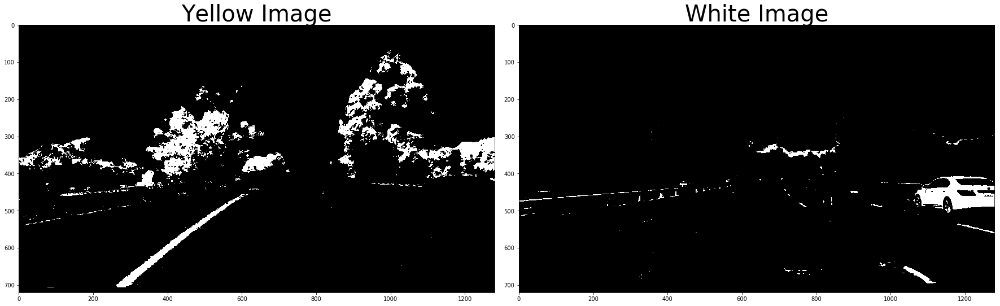

In [10]:
# Color in range of yellow and white
def color_range(img):
    # Convert to HSV color space and separate the S channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # Threshold yellow and white
    yellow_lower = np.array([15, 65, 65])
    yellow_upper = np.array([30, 255, 255])
    white_lower = np.array([0, 0, 195])
    white_upper = np.array([255, 30, 255])
    # Threshold the RBG image to get only yellow and white colors
    yellow = cv2.inRange(hsv, yellow_lower, yellow_upper)
    white = cv2.inRange(hsv, white_lower, white_upper)
        
    return yellow, white

yellow,white = color_range(image)

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()

ax1.imshow(yellow,cmap='gray')
ax1.set_title('Yellow Image',fontsize=40)

ax2.imshow(white,cmap='gray')
ax2.set_title('White Image',fontsize=40)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

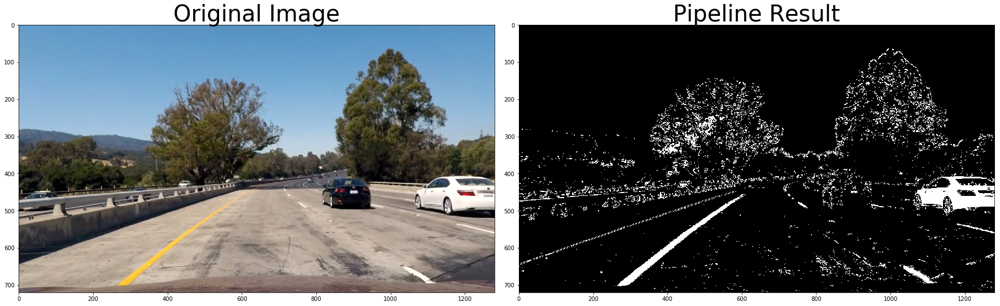

In [11]:
# Combine sobel gradient and color binary
def combined_thresh(img):
    # Sobel X and Y threshold
    absx_bin = abs_sobel_thresh(img,orient='x',sobel_kernel=3,thresh=(20,100))
    absy_bin = abs_sobel_thresh(img,orient='y',sobel_kernel=3,thresh=(20,50))
    # Sobel magnitude and direction threshold
    mag_bin = mag_thresh(img,sobel_kernel=3,mag_thresh=(30,100))
    dir_bin = dir_threshold(img,sobel_kernel=15,thresh=(0.7,1.3))
    
    sobel_bin = np.zeros_like(dir_bin)
    sobel_bin[(((absx_bin == 1) & (absy_bin == 1)) | # Sobel X and Y binary
              ((mag_bin == 1) & (dir_bin == 1)))] = 1 # Sobel magnitude and direction
    
    # Saturation channel threshold
    s_bin = hls_select(img,thresh=(100,255))
    # Red channel threshold
    r_bin = r_thresh(img,thresh=(200,255))
    # Color in yellow and white range
    y_bin,w_bin = color_range(img)
    
    combined = np.zeros_like(dir_bin)
    
    # Sobel threshold result bit or with color mask
    combined[(sobel_bin == 1) |
             ((y_bin >= 1) & (s_bin == 1)) | # Color in yellow with saturation binary
              (w_bin >= 1) & (r_bin == 1)] = 1 # Color in white with red binary
    
    return combined,sobel_bin,s_bin,r_bin,y_bin,w_bin

result,_,_,_,_,_ = combined_thresh(image)

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image',fontsize=40)

ax2.imshow(result,cmap='gray')
ax2.set_title('Pipeline Result',fontsize=40)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

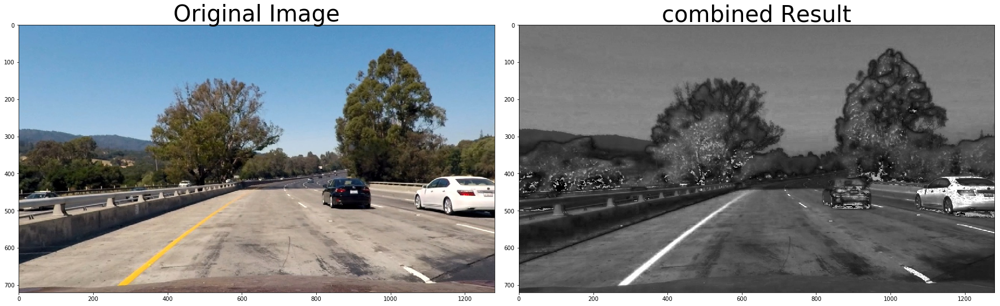

In [12]:
def combined_color(img):
    # Get S channel from HLS space
    s_channel = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)[:,:,2]
    # Get R channel from RGB space
    r_channel = img[:,:,0]
    # Get yellow and white in range from HSV space
    y_bin,w_bin = color_range(img)
    
    combined_channel = (s_channel + 0.5 * r_channel)/1.5
    yellow_channel = 0.3 * y_bin + 0.6 * s_channel + 0.3 * r_channel
    white_channel = 0.2 * w_bin + 0.8 * r_channel
    
    return combined_channel,yellow_channel,white_channel


result,_,_ = combined_color(image)

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image',fontsize=40)

ax2.imshow(result,cmap='gray')
ax2.set_title('combined Result',fontsize=40)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

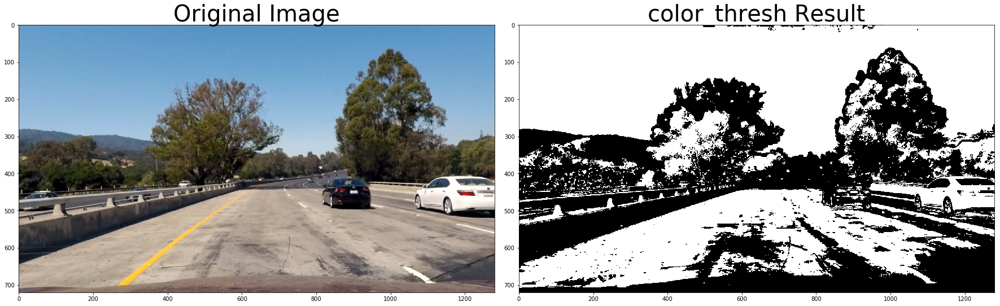

In [13]:
def color_thresh(warped,y_thresh=(80,255),w_thresh=(140,255)):
    
    combined,yellow,white = combined_color(warped)
    # Rescale to 8 bit interger
    scaled_yellow = np.uint8(255 * yellow / np.max(yellow))
    scaled_white = np.uint8(255 * white / np.max(white))
    # Apply a threshold,and create a binary image result
    yellow_binary = np.zeros_like(yellow)
    yellow_binary[(scaled_yellow >= y_thresh[0]) & (scaled_yellow <= y_thresh[1])] = 1
    white_binary = np.zeros_like(white)
    white_binary[(scaled_white >= w_thresh[0]) & (scaled_white <= w_thresh[1])] = 1
    
    combined = np.zeros_like(yellow)
    combined[(yellow_binary == 1) | (white_binary == 1)] =1
    
    return combined,yellow_binary,white_binary

result,_,_ = color_thresh(image)

# Plot the result
f,(ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image',fontsize=40)

ax2.imshow(result,cmap='gray')
ax2.set_title('color_thresh Result',fontsize=40)
plt.subplots_adjust(left=0.,right=1,top=0.9,bottom=0.)

## Apply a perspective transform to rectify binary image ("birds-eye view")

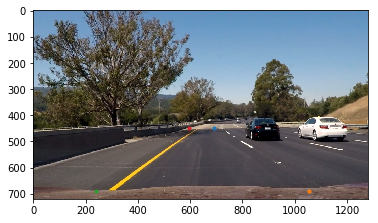

In [14]:
# Read in an image and grayscale it
image_tr = mpimg.imread('test_images/straight_lines1_undist.jpg')
# source image points
plt.imshow(img)
plt.plot(690,450,'.') # top right
plt.plot(1053,688,'.') # bottom right
plt.plot(239,689,'.') # bottom left
plt.plot(595,450,'.') # top left

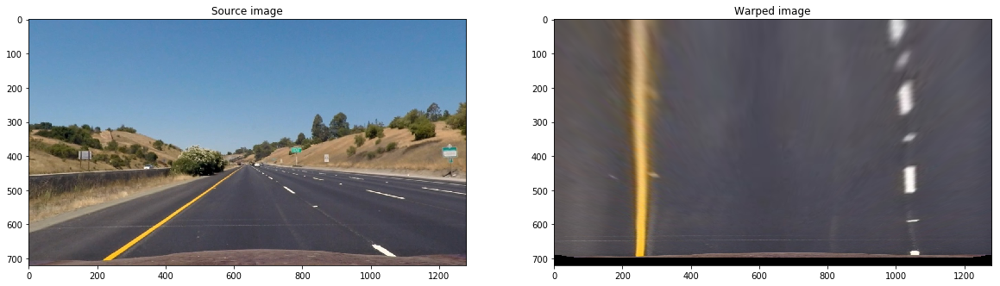

In [15]:
# Define perspective transform function
def warp_M(img):
    # Define calibration box in source (original) and destination (desired or 
    # warped ) coordinates
    img_size = (img.shape[1],img.shape[0])
    
    # Four source coordinates
    src = np.float32([[690,450],
                      [1053,688],
                      [239,689],
                      [595,450]])
    
    # Four desired coordinates
    dst = np.float32([[1053,0],
                      [1053,688],
                      [239,688],
                      [239,0]])

    # Compute the perspective transform,M
    M = cv2.getPerspectiveTransform(src,dst)
    
    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    # Create warped image - ueses linear interpolation
    warped = cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    
    return warped,M,Minv

# Get perspective transform
warped_im,_,_ =warp_M(image_tr)

# Visualize undistortion
f,(ax1,ax2) = plt.subplots(1,2,figsize=(20,10))

ax1.set_title('Source image')
ax1.imshow(image_tr)
ax2.set_title('Warped image')
ax2.imshow(warped_im)


## Identify lane-line pixels and fit their positions with a polynomial

In [16]:
def draw_line_fit(out_img, left_fit, right_fit):
    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )

    # Draw the fitted line onto the warped blank image
    if left_fit.any():
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        left_line_pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        cv2.polylines(out_img, np.int_(left_line_pts), isClosed=False, color=(255,255,0), thickness=5)
    if right_fit.any():
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        right_line_pts = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
        cv2.polylines(out_img, np.int_(right_line_pts), isClosed=False, color=(255,255,0), thickness=5)
       
    return out_img

def draw_line_region(out_img, left_fit, right_fit, margin=100):
    # Create an image to draw on and an image to show the selection window
    window_img = np.zeros_like(out_img)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, out_img.shape[0]-1, out_img.shape[0] )
    
    if left_fit.any():
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        
    if right_fit.any():
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
  
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result

# Sliding Window search with hostogram
def sliding_window_search(binary_warped, nwindows=9, margin=100, minpix=50, bias=200):
    """
    Sliding window search method. It's used to locate lane pixels from scratch, given no previous information.
    Input: binary_warped: binary image with birds' eye view,
           nwindows: number of sliding windows
           margin: width of the windows +/- margin
           minpix: minimum number of pixels found to recenter window
           bias: bias pixel of line base
    Ouput: left and right fitted x,y and a diagnosis image.
    """
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    leftpoint = np.int(histogram.shape[0]/2 - bias)
    rightpoint = np.int(histogram.shape[0]/2 + bias)
    leftx_base = np.argmax(histogram[:leftpoint])
    rightx_base = np.argmax(histogram[rightpoint:]) + rightpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set minimum number of pixels found to recenter window
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    left_fit = []
    right_fit = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & 
                           (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    if leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Create an output image to draw on and  visualize the result
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Visualization of the fitted line and shadow area
    out_img = draw_line_fit(out_img, left_fit, right_fit)
    # out_img = draw_line_region(out_img, left_fit, right_fit, margin=margin)
    
    return out_img, left_fit, right_fit
    
    
def prev_search(binary_warped, left_fit_last, right_fit_last, margin=100):
    """
    Search lane pixels within a polynomial ROI given the previous left and right lane polynomial function.
    Input: binary_warped: a binary image from birds' eye view, 
           left_fit, right_fit: left lane and right lane polynomial function,
           margin: width of the windows +/- margin
    Output: fitted left/right lane lines, a diagnosis image.
    """
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = []
    right_lane_inds = []
    left_fit = []
    right_fit = []
    
    if left_fit_last.any():  
        left_lane_inds = ((nonzerox > (left_fit_last[0]*(nonzeroy**2) + left_fit_last[1]*nonzeroy + left_fit_last[2] - margin)) & 
                          (nonzerox < (left_fit_last[0]*(nonzeroy**2) + left_fit_last[1]*nonzeroy + left_fit_last[2] + margin))) 
    if right_fit_last.any():
        right_lane_inds = ((nonzerox > (right_fit_last[0]*(nonzeroy**2) + right_fit_last[1]*nonzeroy + right_fit_last[2] - margin)) & 
                           (nonzerox < (right_fit_last[0]*(nonzeroy**2) + right_fit_last[1]*nonzeroy + right_fit_last[2] + margin)))  
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    if leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        left_fit = left_fit_last
    if rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = right_fit_last
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Visualization of the fitted line and shadow area
    out_img = draw_line_fit(out_img, left_fit, right_fit)
    out_img = draw_line_region(out_img, left_fit, right_fit, margin=margin)
    
    return out_img, left_fit, right_fit

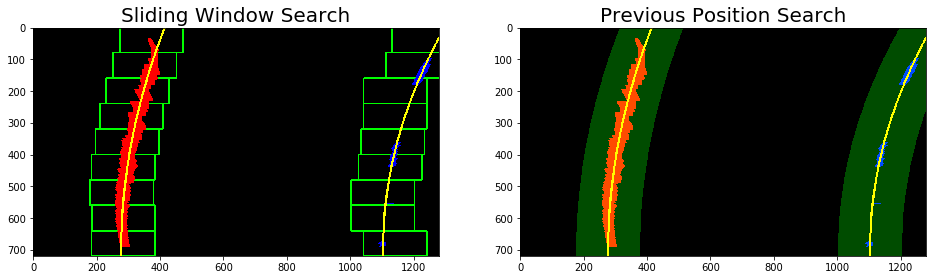

In [17]:
# Generate the fitted line by sliding window search on a binary warped image 
images_line_sliding = []
images_line_prev = []

# Get perspective transform
warped_im,_,_ = warp_M(hls_binary)

# Generate the sliding window search on a binary warped image
line_sliding,left_fit,right_fit = sliding_window_search(warped_im,margin=100)
# Generate the previous line position search on a binary warped image
line_prev,_, _ = prev_search(warped_im,left_fit,right_fit,margin=100)

images_line_sliding.append(line_sliding)
images_line_prev.append(line_prev)

write_name = './output_images/test_images/'+'line'+str(idx+1)+'.jpg'
mpimg.imsave(write_name,line_sliding)
    
f,(ax1,ax2) = plt.subplots(1,2,figsize=(16,8))
ax1.imshow(images_line_sliding[0])
ax1.set_title('Sliding Window Search',fontsize=20)
ax2.imshow(images_line_prev[0])
ax2.set_title('Previous Position Search',fontsize=20)

### Calculation of radius of curvature after correcting for scale in x and y
Assuming that the lane is about 40 meters long and 3.7 meters wide.

In [18]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 40/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def cal_curvature(img,fit):
    ploty = np.linspace(0,img.shape[0]-1,img.shape[0])# to cover same y-range as image
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    # Define y-value where we want radius of curvature
    # The maximum y-value is chosen, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(ploty*ym_per_pix,plotx*xm_per_pix,2)
    # Calculate the new radius of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    curverad = np.round(curverad,3)
    
    return curverad

def cal_offset_pixel(img,fit):
    # Define y-value where we want radius of curvature
    # The maximum y-value is chosen, corresponding to the bottom of the image
    y_eval = img.shape[0] - 1
    x_eval = fit[0]*y_eval**2 + fit[1]*y_eval + fit[2]
    #Calculate the offset distance in pixel
    # Positive: right side, Negative: left side
    offset = (x_eval - img.shape[1]/2)
    
    return offset

def cal_offset(img,fit):
    offset = cal_offset_pixel(img,fit)*xm_per_pix
    offset = np.round(offset,3)
    
    return offset

### Draw the image of lane result plotted back down onto the road

In [19]:
def draw_lane_region(undist,Minv,left_fit,right_fit):
    # Generate x and y values for plotting
    ploty = np.linspace(0,undist.shape[0]-1,undist.shape[0])
    left_fitx = []
    right_fitx = []
    pts_left = np.array([False])
    pts_right = np.array([False])
    pts = np.array([False])
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    if left_fit.any():
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        pts_left = np.array([np.transpose(np.vstack([left_fitx,ploty]))])
    if right_fit.any():
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx,ploty])))])
    
    pts = np.hstack((pts_left,pts_right))
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(undist).astype(np.uint8)
    # Draw the lane onto the warped blank image
    if pts.any():
        cv2.fillPoly(color_warp,np.int_([pts]),(0,255,0))
    if pts_left.any():
        cv2.polylines(color_warp,np.int_(pts_left),isClosed=False,color=(255,0,0),thickness=20)
    if pts_right.any():
        cv2.polylines(color_warp,np.int_(pts_right),isClosed=False,color=(0,0,255),thickness=20)
    
    # Warp the blank back to original image space using inverse perspective matrix(Minv)
    newwarp = cv2.warpPerspective(color_warp,Minv,(undist.shape[1],undist.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist,1,newwarp,0.2,0)
    
    return result

def put_curvature_and_offset(result,left_fit,right_fit):
    if left_fit.any() & right_fit.any():
        # Calculate curverad
        left_curverad = cal_curvature(result,left_fit)
        right_curverad = cal_curvature(result,right_fit)
        radius_curvature = (left_curverad + right_curverad)/2
        # Calculate offset
        left_offset = cal_offset(result,left_fit)
        right_offset = cal_offset(result,right_fit)
        offset_distance = (left_offset + right_offset)/2
        
        # Print Radius of Curvature and Offset Distance on the lane result
        font = cv2.FONT_HERSHEY_SIMPLEX
        if left_curverad and right_curverad:
            str1 = str('Radius of Curvature: '+ str(np.round(radius_curvature,3))+'m')
            cv2.putText(result,str1,(50,50),font,1,(255,255,255),2,cv2.LINE_AA)
            str2 = str('Left Curvature: '+ str(np.round(left_curverad,3))+'m')
            cv2.putText(result,str2,(50,100),font,1,(255,255,255),2,cv2.LINE_AA)
            str3 = str('Right of Curvature: '+ str(np.round(right_curverad,3))+'m')
            cv2.putText(result,str3,(50,150),font,1,(255,255,255),2,cv2.LINE_AA)
            str4 = str('Offset Distance: ' + str(np.round(offset_distance,3))+'m')
            cv2.putText(result,str4,(50,200),font,1,(255,255,255),2,cv2.LINE_AA)
    
    return result

## Detect lane pipeline
### 1.Undistort the original image
### 2.Binary gradient of the undistorted image
### 3.Perspective transform of the binary image
### 4.Find lane from the perspective transform image
### 5.Plot the lane result back to the undistorted image

In [20]:
# Detect lane pipeline
def find_lane_pipeline(img):
    # Undistort the original image
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    # Binary gradient of the undistorted image
    combined_binary,_,_,_,_,_ = combined_thresh(undistorted)
    # Perspective tranform of the binary image
    binary_warped,M,Minv = warp_M(combined_binary)
    # Find lane from the perspective transform image
    out_img,left_fit,right_fit = sliding_window_search(binary_warped,margin=100)
    # Plot the lane result back to the undistorted image
    result = draw_lane_region(undistorted,Minv,left_fit,right_fit)
    result = put_curvature_and_offset(result,left_fit,right_fit)
    
    return result

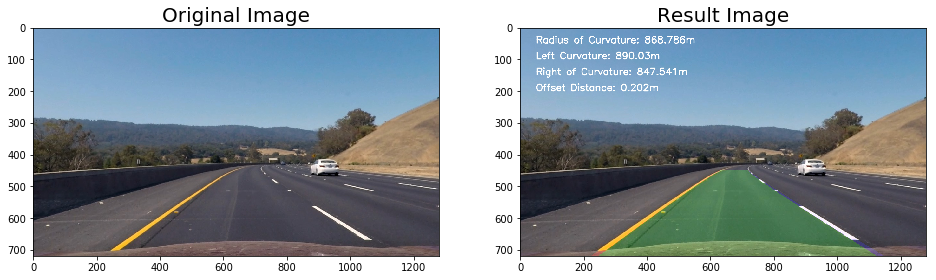

In [21]:
# Read the list of undistorted images,generate the result images
images_result = []

for idx,img in enumerate(images_origin):
    result = find_lane_pipeline(img)
    images_result.append(result)
    
    write_name = './output_images/test_images/'+'result'+str(idx+1)+'.jpg'
    mpimg.imsave(write_name,result)
    
f,(ax1,ax2) = plt.subplots(1,2,figsize=(16,8))
ax1.imshow(images_undist[3])
ax1.set_title('Original Image',fontsize=20)
ax2.imshow(images_result[3])
ax2.set_title('Result Image',fontsize=20)

## Pipeline(test videos)

In [22]:
from collections import deque

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self,n=10):
        # number of queue to store data of last iterations
        self.n = n
        # number of fits in last iterations buffer
        self.n_buffered = 0
        # was the line detected in the last iteration?
        self.detected = False
        # x values of last n iterations
        self.recent_xfitted = deque([],maxlen=n)
        # polynomial coefficients of the last n iterations
        self.recent_fit = deque([],maxlen=n)
        # average x values of the fitted line over the last n iterations
        self.best_xval = None
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = np.array([0])
        # x values of the most recent fit
        self.current_xval = None
        # Polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # Pixels of vehicle center from the line
        self.line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0],dtype='float')
        
    def update_current_fit(self,fit):
        self.current_fit = fit
        
    def update_current_xval(self,img):
        yvals = np.linspace(0,img.shape[0]-1,img.shape[0])
        self.current_xval = self.current_fit[0]*yvals**2 + self.current_fit[1]*yvals + self.current_fit[2]
        
    def update_curvature(self,img):
        self.radius_of_curvature = cal_curvature(img,self.current_fit)
        
    def update_offset(self,img):
        self.line_base_pos = cal_offset_pixel(img,self.current_fit)
    
    def update_diffs(self):
        if self.n_buffered > 0:
            self.diffs = self.current_fit - self.best_fit
        else:
            self.diffs = np.array([0,0,0],dtype='float')
            
    def update_best(self,img):
        if len(self.recent_xfitted) > 0:
            self.best_xval = np.mean(self.recent_xfitted,axis=0)
            yvals = np.linspace(0,img.shape[0]-1,img.shape[0])
            xvals = self.best_xval
            self.best_fit = np.polyfit(yvals,xvals,2)
            
    def add_data(self):
        self.recent_xfitted.appendleft(self.current_xval)
        self.recent_fit.appendleft(self.current_fit)
        self.n_buffered = len(self.recent_xfitted)
        
    def pop_data(self):
        if self.n_buffered > 0:
            self.recent_xfitted.pop()
            self.recent_fit.pop()
            self.n_buffered = len(self.recent_xfitted)
            
    def update(self,img,fit):
        self.update_current_fit(fit)
        self.update_current_xval(img)
        self.update_diffs()
        self.update_curvature(img)
        self.update_offset(img)
        
    def set_detected(self,img,inp=True):
        self.detected = inp
        if self.detected:
            self.add_data()
            self.update_best(img)
        else:
            if self.n_buffered > 0:
                self.pop_data()
                self.update_best(img)
    
        

## Sanity Check
* Checking that they have similiar curvature
* Checking that they are seperated by approximately the right distance horizontally
* Checking that they are roughly parallel

In [23]:
curv_ratio_threshold = 10 # Threshold of the curvature ratio between left and right line [1]
distance_max_threshold = 1000 # Threshold of the max diatance between left and right line [pixel]
distance_min_threshold = 400 # Threshold of the min distance between left and right line [pixel]
distance_deviation_threshold = 300 # Threshold of the standard deviation of distance between left and right line [pixel]

def sanity_check(left_line,right_line):
    # Confirm that the detected lane lines are real
    # Checking that they have similiar curvature
    left_curverad = left_line.radius_of_curvature
    right_curverad = right_line.radius_of_curvature
    diff_ratio = left_curverad / right_curverad
    if (diff_ratio >= curv_ratio_threshold) | (diff_ratio <= 1./curv_ratio_threshold):
        return False
    # Checking that they are separated by approximately the right distance horizontally
    left_fitx = left_line.current_xval
    right_fitx = right_line.current_xval
    distance = right_fitx - left_fitx
    distance_max = max(distance)
    distance_min = min(distance)
    if (distance_max > distance_max_threshold) | (distance_min < distance_min_threshold):
        return False
    
    # Checking that they are roughly parallel
    distance_deviation = np.std(distance)
    if distance_deviation >= distance_deviation_threshold:
        return False
    
    return True

def find_lane(binary_warped,left_line,right_line):
    # Update line data
    if left_line.n_buffered > 0 & right_line.n_buffered > 0:
        # If line buffer exists then use previous best search
        left_fit_last = left_line.best_fit
        right_fit_last = right_line.best_fit
        out_img,left_fit,right_fit = prev_search(binary_warped,left_fit_last,right_fit_last)
    else:
        # If line buffer loses then use sliding window search
        out_img,left_fit,right_fit = sliding_window_search(binary_warped,margin=100)
        
    if left_fit.any() & right_fit.any():
        left_line.update(out_img,left_fit)
        right_line.update(out_img,right_fit)
        
        # Sanity Check
        if sanity_check(left_line,right_line):
            # If sanity check passes, add current fit to buffer
            left_line.set_detected(out_img,inp=True)
            right_line.set_detected(out_img,inp=True)
        else:
            # If sanity check not passes, ignore the current fit
            left_line.set_detected(out_img,inp=False)
            right_line.set_detected(out_img,inp=False)
    else:
        left_line.set_detected(out_img,inp=False)
        right_line.set_detected(out_img,inp=False)
        
    left_best_fit = left_line.best_fit
    right_best_fit = right_line.best_fit
    
    return out_img,left_best_fit,right_best_fit
        

## Video processing

In [24]:
# Define left and right lines for detection
left_line = Line()
right_line = Line()

def find_lane_pipeline_video(img,debug=True):
    # Undistort the orginal image
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    # Perspective transform of the undistorted
    warped_color,M,Minv = warp_M(undistorted)
    # Binary gradient of the warped image
    warped_binary,_,_,_,_,_ = combined_thresh(warped_color)
    
    # Find lane from the perspective transform image
    out_img,left_best_fit,right_best_fit = find_lane(warped_binary,left_line,right_line)
    # Plot the lane result back to the undistorted image
    result = draw_lane_region(undistorted,Minv,left_best_fit,right_best_fit)
    result = put_curvature_and_offset(result,left_best_fit,right_best_fit)
    
    if debug:
        # Calculate the size of screens
        result_screen_w = result.shape[1]
        result_screen_h = result.shape[0]
        debug_screen_w = np.int(result_screen_w/3)
        debug_screen_h = np.int(result_screen_h/3)
        screen_w = result_screen_w + debug_screen_w
        screen_h = result_screen_h
        # Assign result image to the screen
        screen = np.zeros((screen_h,screen_w,3),dtype=np.uint8)
        screen[0:result_screen_h,0:result_screen_w] = result
        # Assign debug image to the screen
        debug_img_1 =warped_color
        screen[0:debug_screen_h,result_screen_w:,:] = cv2.resize(debug_img_1,(debug_screen_w,debug_screen_h))
        debug_img_2 = np.dstack((warped_binary,warped_binary,warped_binary))*255
        screen[debug_screen_h : debug_screen_h*2,result_screen_w:,:] =cv2.resize(debug_img_2,(debug_screen_w,debug_screen_h))
        screen[debug_screen_h*2 : debug_screen_h*3,result_screen_w:,:] =cv2.resize(out_img,(debug_screen_w,debug_screen_h))
        
        # Print fit coefficients of the lane result
        font = cv2.FONT_HERSHEY_SIMPLEX
        str1 = str('Left lane buffer number: ' + str(left_line.n_buffered))
        cv2.putText(screen,str1,(800,50),font,1,(255,255,255),2,cv2.LINE_AA)
        str2 = str('Right lane buffer number: ' + str(right_line.n_buffered))
        cv2.putText(screen,str2,(800,100),font,1,(255,255,255),2,cv2.LINE_AA)
        str3 = str('Left lane detected: ' + str(left_line.detected))
        cv2.putText(screen,str3,(800,150),font,1,(255,255,255),2,cv2.LINE_AA)
        str4 = str('Right lane detected: ' + str(right_line.detected))
        cv2.putText(screen,str4,(800,200),font,1,(255,255,255),2,cv2.LINE_AA)
        
        return screen
    else:
        return result
        
        
    

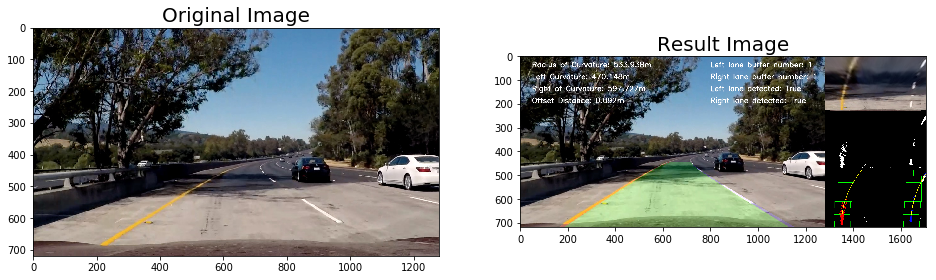

In [25]:
image_test_video = images_origin[5]
images_result_video = find_lane_pipeline_video(image_test_video,debug=True)

f,(ax1,ax2) = plt.subplots(1,2,figsize = (16,8))
ax1.imshow(image_test_video)
ax1.set_title('Original Image',fontsize=20)
ax2.imshow(images_result_video)
ax2.set_title('Result Image',fontsize=20)

## Try the first project video

In [26]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [27]:
left_line = Line()
right_line = Line()

def find_lane_pipeline_video1(img):
    result = find_lane_pipeline_video(img,debug=True)
    return result

video_output = 'project_video_result.mp4'
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(find_lane_pipeline_video1)
%time clip.write_videofile(video_output,audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [08:39<00:00,  2.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

Wall time: 8min 40s


## Try the second challenge video.

Capture test images from the challenge video, then test the binary function and perspective transform function.

In [28]:
# Capture test images from the challenge video.
vc = cv2.VideoCapture("challenge_video.mp4")
time = 0
timePeriod = 25

if vc.isOpened():
    rval, frame = vc.read()
else:
    rval = False
    
 
while rval:
    rval, frame = vc.read()
    if(time%timePeriod == 0):
        cv2.imwrite('test_images/challenge' + str(time) + '.jpg', frame)
    time = time + 1
    cv2.waitKey(1)

vc.release()

## Do perspective transform for challenge images

In [29]:
# Compute the perspective transform and warp the images
def perspective_transform_challenge(img):

    img_size = (img.shape[1], img.shape[0])
        
    # Four source coordinates
    src = np.float32(
        [[285, 720],
         [1125, 720],
         [595, 480],
         [725, 480]])
    # Four desired coordinates
    dst = np.float32(
        [[310, 720],
         [1010, 720],
         [310, 0],
         [1010, 0]])
    
    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    # Compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Create warped image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

def draw_straight_line(img):
    
    cv2.line(img, (285, 720), (595, 480), color=(255,0,0), thickness=1)
    cv2.line(img, (1125, 720), (725, 480), color=(255,0,0), thickness=1)
    
    return img

M = 
 [[ -5.42635659e-01  -1.41182171e+00   9.69302326e+02]
 [ -8.21565038e-15  -1.95348837e+00   9.37674419e+02]
 [ -1.18178037e-17  -2.29328165e-03   1.00000000e+00]]
Minv = 
 [[  1.85714286e-01  -7.65128968e-01   5.37428571e+02]
 [ -2.66453526e-15  -5.11904762e-01   4.80000000e+02]
 [ -4.77048956e-18  -1.17394180e-03   1.00000000e+00]]


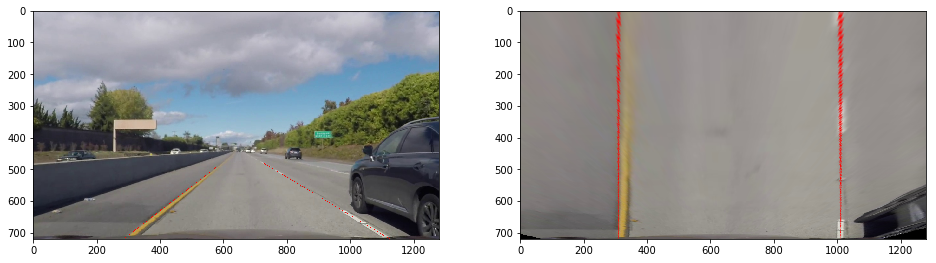

In [30]:
# Test the challenge straight images with perspective transform
img_straight_challenge = mpimg.imread('test_images/challenge475.jpg')
img_straight_challenge = cv2.undistort(img_straight_challenge, mtx, dist, None, mtx)
img_straight_challenge = draw_straight_line(img_straight_challenge)
warped_straight_challenge, M_challenge, Minv_challenge = perspective_transform_challenge(img_straight_challenge)


print('M = \n', M_challenge)
print('Minv = \n', Minv_challenge)

fig = plt.figure(figsize=(16, 8))
fig.add_subplot(1,2,1)
plt.imshow(img_straight_challenge)
fig.add_subplot(1,2,2)
plt.imshow(warped_straight_challenge, cmap='gray')

plt.show()

In [31]:
def find_lane_pipeline_video_challenge(img,y_thresh,w_thresh,debug=True):
    # Undistort the orginal image
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    # Perspective transform of the undistorted
    warped_color,M,Minv = perspective_transform_challenge(undistorted)
    # Binary gradient of the warped image
    warped_binary, _, _ = color_thresh(warped_color, y_thresh, w_thresh)
    #warped_binary,_,_,_,_,_ = combined_thresh(warped_color)
    
    # Find lane from the perspective transform image
    out_img,left_best_fit,right_best_fit = find_lane(warped_binary,left_line,right_line)
    # Plot the lane result back to the undistorted image
    result = draw_lane_region(undistorted,Minv,left_best_fit,right_best_fit)
    result = put_curvature_and_offset(result,left_best_fit,right_best_fit)
    
    if debug:
        # Calculate the size of screens
        result_screen_w = result.shape[1]
        result_screen_h = result.shape[0]
        debug_screen_w = np.int(result_screen_w/3)
        debug_screen_h = np.int(result_screen_h/3)
        screen_w = result_screen_w + debug_screen_w
        screen_h = result_screen_h
        # Assign result image to the screen
        screen = np.zeros((screen_h,screen_w,3),dtype=np.uint8)
        screen[0:result_screen_h,0:result_screen_w] = result
        # Assign debug image to the screen
        debug_img_1 =warped_color
        screen[0:debug_screen_h,result_screen_w:,:] = cv2.resize(debug_img_1,(debug_screen_w,debug_screen_h))
        debug_img_2 = np.dstack((warped_binary,warped_binary,warped_binary))*255
        screen[debug_screen_h : debug_screen_h*2,result_screen_w:,:] =cv2.resize(debug_img_2,(debug_screen_w,debug_screen_h))
        screen[debug_screen_h*2 : debug_screen_h*3,result_screen_w:,:] =cv2.resize(out_img,(debug_screen_w,debug_screen_h))
        
        # Print fit coefficients of the lane result
        font = cv2.FONT_HERSHEY_SIMPLEX
        str1 = str('Left lane buffer number: ' + str(left_line.n_buffered))
        cv2.putText(screen,str1,(800,50),font,1,(255,255,255),2,cv2.LINE_AA)
        str2 = str('Right lane buffer number: ' + str(right_line.n_buffered))
        cv2.putText(screen,str2,(800,100),font,1,(255,255,255),2,cv2.LINE_AA)
        str3 = str('Left lane detected: ' + str(left_line.detected))
        cv2.putText(screen,str3,(800,150),font,1,(255,255,255),2,cv2.LINE_AA)
        str4 = str('Right lane detected: ' + str(right_line.detected))
        cv2.putText(screen,str4,(800,200),font,1,(255,255,255),2,cv2.LINE_AA)
        
        return screen
    else:
        return result

In [32]:
# Read the list of challenge test images
images_challenge_test = glob.glob('./test_images/challenge*.jpg')

for idx,fname in enumerate(images_challenge_test):
    left_line = Line()
    right_line = Line()
    img = mpimg.imread(fname)
    undist = cv2.undistort(img,mtx,dist,None,mtx)
    warped_color,M,Minv = perspective_transform_challenge(undist)
    warped_binary,_,_,_,_,_ = combined_thresh(warped_color)
    combined_channel, yellow_channel, white_channel = combined_color(warped_color)
    color_binary, yellow_bin, white_bin = color_thresh(warped_color, (80,255), (200,255))
    
    result = find_lane_pipeline_video_challenge(img, (80,255), (200,255), debug=True)
    
    write_name = './output_images/challenge_images/'+'binary_challenge'+str(idx+1)+'.jpg'
    mpimg.imsave(write_name,warped_binary,cmap='gray')
    write_name = './output_images/challenge_images/'+'binary_warped'+str(idx+1)+'.jpg'
    mpimg.imsave(write_name,warped_color,cmap='gray')
#     write_name = './output_images/challenge_images/'+'color_warped'+str(idx+1)+'.jpg'
#     mpimg.imsave(write_name,color_warped)
    write_name = './output_images/challenge_images/'+'result'+str(idx+1)+'.jpg'
    mpimg.imsave(write_name,result)
    

In [33]:
left_line = Line()
right_line = Line()

def find_lane_pipeline_video2(img):
    result = find_lane_pipeline_video_challenge(img,(80,255),(200,255),debug=True)
    return result

video_output = 'challenge_video_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
clip = clip1.fl_image(find_lane_pipeline_video2)
%time clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_result.mp4
[MoviePy] Writing video challenge_video_result.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [02:14<00:00,  3.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_result.mp4 

Wall time: 2min 16s
